In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
import zipfile
local_zip = '/content/drive/MyDrive/human-img-seg.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('dataset')
zip_ref.close()

In [1]:
# Common
import os 
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from IPython.display import clear_output as cls

# Data 
from tqdm import tqdm
import tensorflow.data as tfd

# Data Visualization
import matplotlib.pyplot as plt

# Model Building
from tensorflow.keras import layers
from tensorflow.keras import callbacks
from tensorflow.keras import optimizers
from tensorflow.keras import metrics
from tensorflow.keras.optimizers.schedules import ExponentialDecay

# Model visualization
from tensorflow.keras.utils import plot_model

# Extra
from typing import List, Tuple, Union

In [4]:
image_train_dir = "/content/dataset/training/sample"
mask_train_dir = "/content/dataset/training/mask"

train_img_paths = sorted(
    [os.path.join(image_train_dir, fname)
     for fname in os.listdir(image_train_dir)
     if fname.endswith(".png")])
train_mask_paths = sorted(
    [os.path.join(mask_train_dir, fname)
     for fname in os.listdir(mask_train_dir)
     if fname.endswith(".png") and not fname.startswith(".")])

In [5]:
image_test_dir = "/content/dataset/testing/sample"
mask_test_dir = "/content/dataset/testing/mask"

test_img_paths = sorted(
    [os.path.join(image_test_dir, fname)
     for fname in os.listdir(image_test_dir)
     if fname.endswith(".png")])
test_mask_paths = sorted(
    [os.path.join(mask_test_dir, fname)
     for fname in os.listdir(mask_test_dir)
     if fname.endswith(".png") and not fname.startswith(".")])

In [6]:
N_IMAGE_CHANNELS = 3
N_MASK_CHANNELS = 1

IMAGE_WIDTH = 256
IMAGE_HEIGHT = 256

IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT, N_IMAGE_CHANNELS)
MASK_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT, N_MASK_CHANNELS)

BASE_LR = 1e-2

# Model Name
MODEL_NAME = 'UNetForestSegmentation'

BATCH_SIZE = 32

OUTPUT_CHANNELS = 1

EPOCHS = 100
FILTERS = 32

In [7]:
def load_image_and_mask(image_path, mask_path):
    
    '''
    This function takes the file paths of an image and its corresponding mask as input. It first reads the images, then decodes them into tensors, 
    and resizes them to a standard size. After that, the image and mask tensors are normalized by clipping the pixel values between 0 and 1. 
    Finally, the function converts the image and mask tensors to the float32 data type and returns them as a tuple.
    
    Arguments : 
        image_path : The path to the image to be loaded. 
        mask_path  : The path to the mask to be loaded.
    
    Returns :
        image : This is the loaded and the processed image. 
        mask  : This is the loaded and the processed mask.
    
    '''
    
    # Read the images
    image = tf.io.read_file(filename = image_path)
    mask  = tf.io.read_file(filename = mask_path)
    
    # Decode the images
    image = tf.image.decode_jpeg(contents = image, channels = N_IMAGE_CHANNELS)
    mask  = tf.image.decode_jpeg(contents = mask,  channels = N_MASK_CHANNELS)
    
    # Convert the image to a Tensor
    image = tf.image.convert_image_dtype(image = image, dtype = tf.float32)
    mask  = tf.image.convert_image_dtype(image = mask, dtype = tf.float32)
    
    # Resize the image to the desired dimensions
    image = tf.image.resize(images = image, size = (IMAGE_WIDTH, IMAGE_HEIGHT))
    mask  = tf.image.resize(images = mask, size = (IMAGE_WIDTH, IMAGE_HEIGHT))
    
    # Normalize the image
    image = tf.clip_by_value(image, clip_value_min = 0.0, clip_value_max = 1.0)
    mask  = tf.clip_by_value(mask, clip_value_min = 0.0, clip_value_max = 1.0)
    
    # Final conversion
    image = tf.cast(image, dtype = tf.float32)
    mask  = tf.cast(mask,  dtype = tf.float32)
    
    return image, mask

In [8]:
def load_dataset(
    image_paths: list, mask_paths: list, split_ratio: float=0.2, 
    batch_size: int=BATCH_SIZE, shuffle: bool=True, 
    buffer_size: int=1000, n_repeat: int=1) -> Union[Tuple[tfd.Dataset, tfd.Dataset], tfd.Dataset]:
    '''
    This function loads the image and mask data from the provided file paths and creates a TensorFlow dataset. The function
    first creates space to store the image and mask data in numpy arrays. It then iterates over each image and mask pair, 
    loading them using the load_image_and_mask function and storing them in the numpy arrays.
    
    The function then creates a TensorFlow dataset using the numpy arrays. If shuffle is True, it shuffles the dataset
    with a buffer size of buffer_size. If split_ratio is not None, it splits the dataset into two parts with sizes determined
    by the split_ratio, and converts them into batches of size batch_size with drop_remainder=True. The two resulting datasets
    are returned as a tuple.

    If split_ratio is None, the entire dataset is converted into batches of size batch_size with drop_remainder=True, 
    and the resulting dataset is returned.
    
    Args:
        image_paths: A list of strings, containing the file paths of the input images.
        
        mask_paths: A list of strings, containing the file paths of the corresponding mask images.
        
        split_ratio: A float value between 0 and 1, representing the ratio of data to be used for validation. 
                    If split_ratio is set to None, then no data will be split for validation.
                    
        batch_size: An integer, representing the batch size for the input data.
        
        shuffle: A boolean value indicating whether the data should be shuffled or not.
        
        buffer_size: An integer, representing the buffer size for shuffling the data.
        
        n_repeat: An integer, representing the total number of repetations of the data.
    
    Returns:
        If split_ratio is not None, then the function returns a tuple of two Tensorflow datasets. 
        The first dataset contains the training data and the second dataset contains the validation data.
        
        If split_ratio is None, then the function returns a single Tensorflow dataset containing the 
        input data batched and pre-fetched for training.
    
    '''
    
    # Create space for storing the data.
    images = np.empty(shape=(len(image_paths), *IMAGE_SIZE), dtype=np.float32)
    masks  = np.empty(shape=(len(mask_paths), *MASK_SIZE),  dtype=np.float32)
    
    # Iterate over the data.
    index = 0
    for image_path, mask_path in tqdm(zip(image_paths, mask_paths), desc='Loading'):
        
        # Load the image and the mask.
        image, mask = load_image_and_mask(image_path = image_path, mask_path = mask_path)
        
        # Store the image and the mask.
        images[index] = image
        masks[index]  = mask
        
        # Increment the index.
        index += 1
    
    # Create a Tensorflow data.
    data_set = tfd.Dataset.from_tensor_slices((images, masks)).repeat(n_repeat)
    
    # Shuffle the data set.
    if shuffle:
        data_set = data_set.shuffle(buffer_size)
    
    # Split the data 
    if split_ratio is not None:
        
        # Calculate new data sizes after splitting.
        keep_ratio = 1-split_ratio
        data_1_len = int((keep_ratio) * len(images))
        data_2_len = int(split_ratio * len(images))
        
        # Divide the data into 2 parts.
        data_1 = data_set.take(data_1_len)
        data_2 = data_set.skip(data_1_len).take(data_2_len)
        
        # Convert data into batches.
        data_1 = data_1.batch(batch_size, drop_remainder=True).prefetch(tfd.AUTOTUNE)
        data_2 = data_2.batch(batch_size, drop_remainder=True).prefetch(tfd.AUTOTUNE)
        
        # Return the data 
        return data_1, data_2
    
    else:
        
        # Convert data into batches
        data_set = data_set.batch(batch_size, drop_remainder=True).prefetch(tfd.AUTOTUNE)
        
        # Return the data
        return data_set

In [9]:
# Training and Testing Data
train_ds = load_dataset(
    image_paths = train_img_paths,
    mask_paths = train_mask_paths,
    shuffle = True,
    split_ratio=None,
    n_repeat=1,
)
test_ds = load_dataset(
    image_paths = test_img_paths,
    mask_paths = test_mask_paths,
    shuffle = True,
    split_ratio=None,
    n_repeat=1,
)

Loading: 1700it [00:44, 38.33it/s]
Loading: 300it [00:06, 42.91it/s]


In [10]:
print("*"*100)
print(f"{' '*30}Training Data Size : {train_ds.cardinality().numpy() * BATCH_SIZE}")
print(f"{' '*30}Testing Data Size  : {test_ds.cardinality().numpy() * BATCH_SIZE}")
print("*"*100)

****************************************************************************************************
                              Training Data Size : 1696
                              Testing Data Size  : 288
****************************************************************************************************


In [11]:
full_train_size = train_ds.cardinality().numpy()

# Split Ratio
train_val_split = 0.1
valid_size = int(full_train_size * train_val_split)
train_size = full_train_size - valid_size

# Split Data 
training_ds = train_ds.take(train_size)
valid_ds = train_ds.skip(train_size).take(valid_size)

In [12]:
print("*"*100)
print(f"{' '*30}Training Data Size   : {training_ds.cardinality().numpy() * BATCH_SIZE}")
print(f"{' '*30}Validation Data Size : {valid_ds.cardinality().numpy() * BATCH_SIZE}")
print(f"{' '*30}Testing Data Size    : {test_ds.cardinality().numpy() * BATCH_SIZE}")
print("*"*100)

****************************************************************************************************
                              Training Data Size   : 1536
                              Validation Data Size : 160
                              Testing Data Size    : 288
****************************************************************************************************


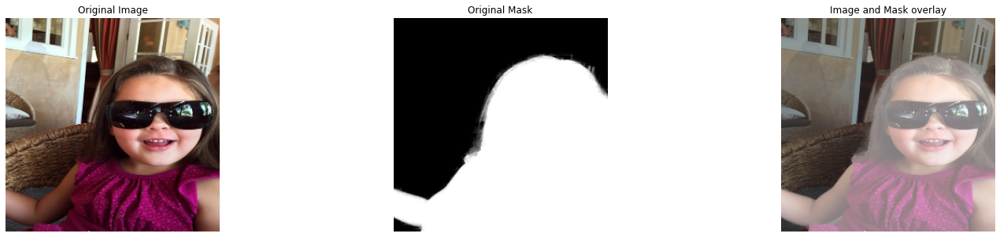

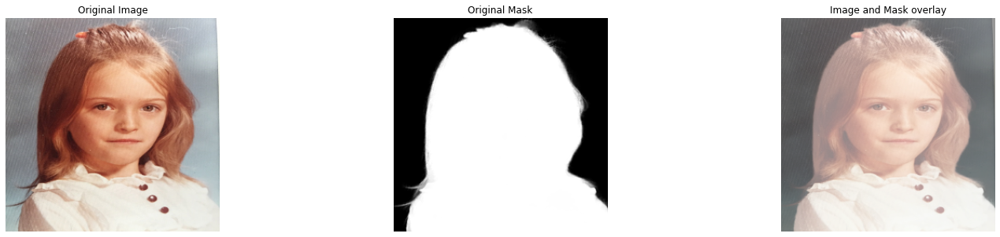

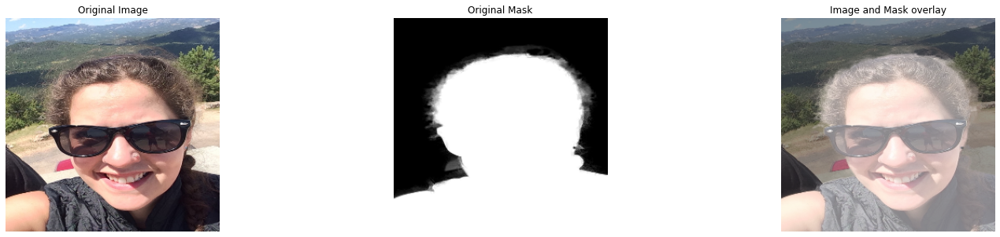

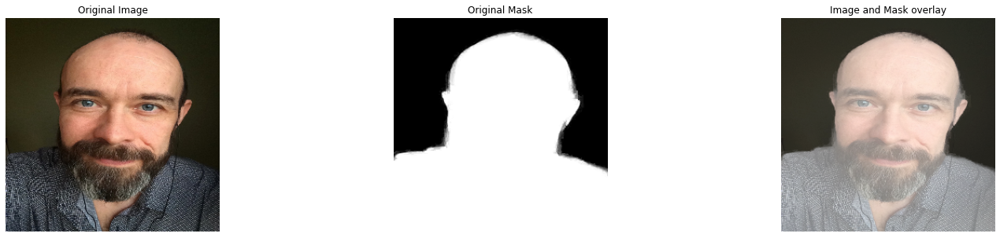

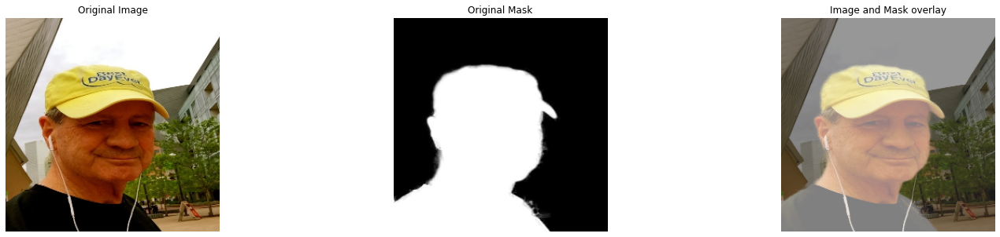

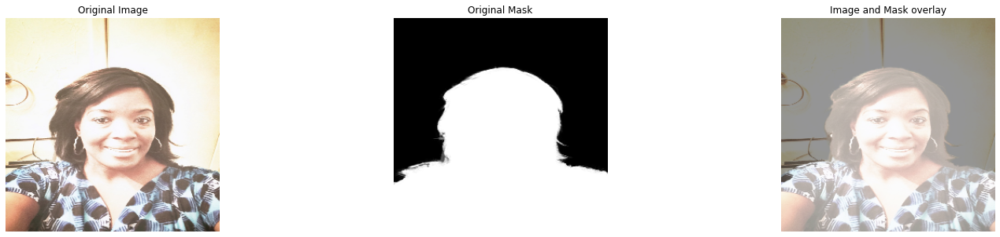

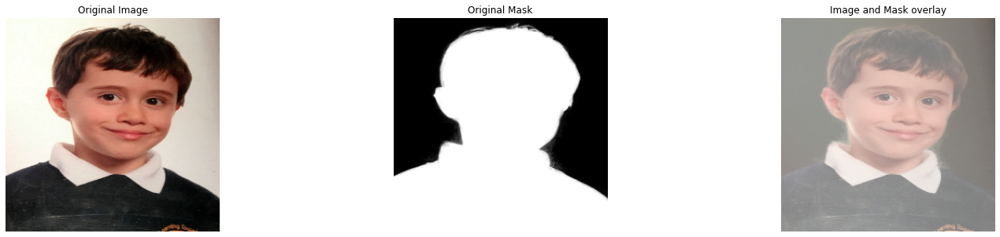

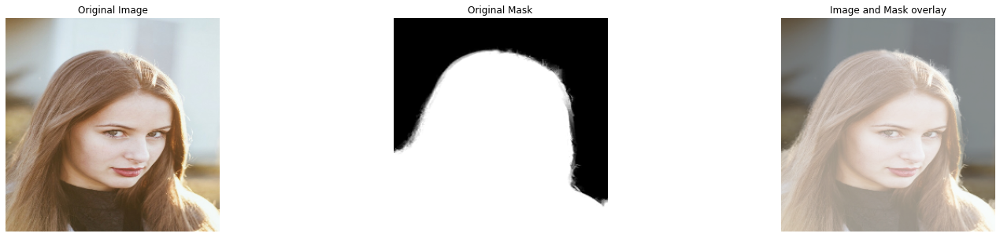

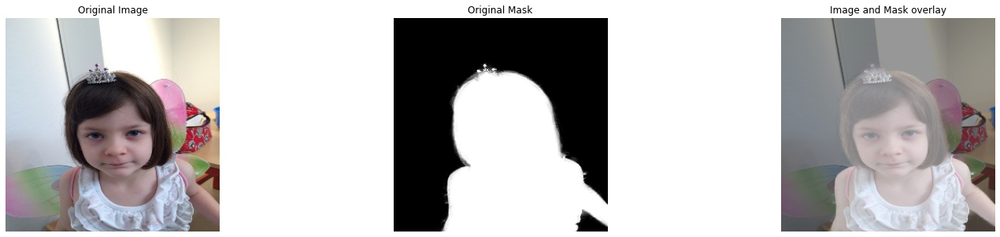

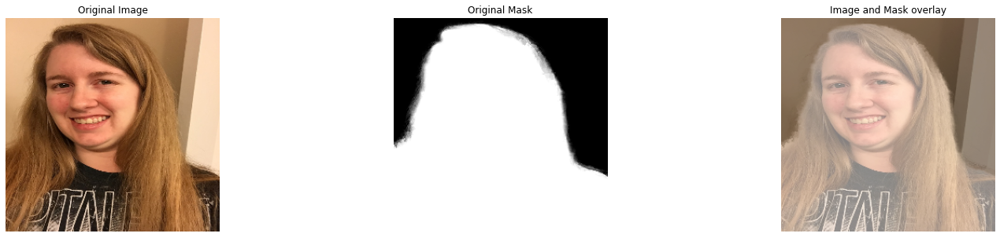

In [13]:
def show_images_and_masks(data : tfd.Dataset, n_images: int=10, FIGSIZE: tuple=(25, 5), model: tf.keras.Model=None):
    
    # Configuration
    if model is None:
        n_cols = 3
    else:
        n_cols = 5
    
    # Collect the data
    images, masks = next(iter(data))
    
    # Iterate over the data
    for n in range(n_images):
        
        # Plotting configuration
        plt.figure(figsize=FIGSIZE)
        
        # Plot the image
        plt.subplot(1, n_cols, 1)
        plt.title("Original Image")
        plt.imshow(images[n])
        plt.axis('off')
        
        # Plot the Mask
        plt.subplot(1, n_cols, 2)
        plt.title("Original Mask")
        plt.imshow(masks[n], cmap='gray')
        plt.axis('off')
        
        # Plot image and mask overlay
        plt.subplot(1, n_cols, 3)
        plt.title('Image and Mask overlay')
        plt.imshow(masks[n], alpha=0.8, cmap='binary_r')
        plt.imshow(images[n], alpha=0.5)
        plt.axis('off')
        
        # Model predictions
        if model is not None:
            pred_mask = model.predict(tf.expand_dims(images[n], axis=0))[0]
            pred_mask = pred_mask>=0.5
            plt.subplot(1, n_cols, 4)
            plt.title('Predicted Mask')
            plt.imshow(pred_mask, cmap='gray')
            plt.axis('off')
            
            plt.subplot(1, n_cols, 5)
            plt.title('Predicted Mask Overlay')
            plt.imshow(pred_mask*images[n], alpha=1, cmap='binary_r')
            #plt.imshow(images[n], alpha=0.5)
            plt.axis('off')
    
        # Show final plot
        plt.show()

show_images_and_masks(data=train_ds)

#UNET

In [14]:
# Encoder

def encoder_block(input_tensor, n_filters, kernal_size= 3, max_pool= True,rate= 0.2):
    x = input_tensor
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(filters=n_filters,
            kernel_size=kernal_size,
            strides=1,
            padding='same',
            activation='relu',
            kernel_initializer='he_normal')(x)
    x = layers.Conv2D(filters=n_filters,
        kernel_size=kernal_size,
        strides=1,
        padding='same',
        activation='relu',
        kernel_initializer='he_normal')(x)
    if max_pool:
        p = layers.Dropout(rate)(x)
        p = layers.MaxPool2D(pool_size=(2,2), strides=(2,2))(p)
        return x, p
    else: 
        x = layers.Dropout(rate)(x)
        return x


def encoder(inputs):
    f1, p1 = encoder_block(inputs, n_filters=FILTERS, rate=0.1)
    f2, p2 = encoder_block(p1, n_filters=2*FILTERS, rate=0.1)
    f3, p3 = encoder_block(p2, n_filters=4*FILTERS, rate=0.2)
    f4, p4 = encoder_block(p3, n_filters=8*FILTERS, rate=0.3)

    return p4, (f1, f2, f3, f4)

In [15]:
def decoder_block(inputs, conv_output, filters, rate=0.2):
    u = layers.Conv2DTranspose(
        filters = filters,
        kernel_size = 3,
        strides = 2,
        padding = 'same',
        activation = 'relu',
        kernel_initializer = 'he_normal'
    )(inputs)
    c = layers.concatenate([u, conv_output])
    c = layers.BatchNormalization()(c)
    c = encoder_block(c, n_filters= filters, rate= rate, max_pool = False)
    
    return c

def decoder(inputs ,convs, output_channels):
    f1, f2, f3, f4 = convs

    c6 = decoder_block(inputs, f4, rate=0.2, filters=8*FILTERS)
    c7 = decoder_block(c6, f3, rate =0.2, filters=4*FILTERS)
    c8 = decoder_block(c7, f2, rate= 0.1, filters=2*FILTERS)
    c9 = decoder_block(c8, f1, rate= 0.1,  filters=FILTERS)

    outputs = layers.Conv2D(output_channels,
                            kernel_size= 1,
                            strides=1,
                            padding='same',
                            activation='sigmoid')(c9)
    return outputs

In [16]:
def decoder_block(inputs, conv_output, filters, rate=0.2):
    u = layers.Conv2DTranspose(
        filters = filters,
        kernel_size = 3,
        strides = 2,
        padding = 'same',
        activation = 'relu',
        kernel_initializer = 'he_normal')(inputs)
    c = layers.concatenate([u, conv_output])
    c = layers.BatchNormalization()(c)
    c = encoder_block(c, n_filters= filters, rate= rate, max_pool = False)
    
    return c

def decoder(inputs ,convs, output_channels):
    f1, f2, f3, f4 = convs

    c6 = decoder_block(inputs, f4, rate=0.2, filters=8*FILTERS)
    c7 = decoder_block(c6, f3, rate =0.2, filters=4*FILTERS)
    c8 = decoder_block(c7, f2, rate= 0.1, filters=2*FILTERS)
    c9 = decoder_block(c8, f1, rate= 0.1,  filters=FILTERS)

    outputs = layers.Conv2D(output_channels,
                            kernel_size= 1,
                            strides=1,
                            padding='same',
                            activation='sigmoid')(c9)
    return outputs

In [17]:
inputs = layers.Input(shape=IMAGE_SIZE)

encoder_output, convs = encoder(inputs)

bottle_neck = encoder_block(encoder_output, n_filters=FILTERS*16, max_pool=False, rate=0.3)

decoder_output = decoder(bottle_neck, convs, OUTPUT_CHANNELS)

model = keras.Model(
    inputs= inputs,
    outputs= decoder_output
)

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 3)  12         ['input_1[0][0]']                
 alization)                                                                                       
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  896         ['batch_normalization[0][0]']    
                                )                                                             

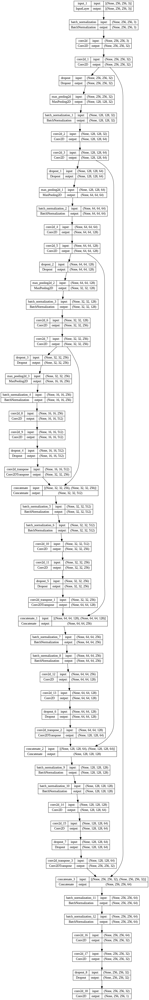

In [18]:
tf.keras.utils.plot_model(model = model, to_file = "Unet2Model.png", dpi = 96, show_shapes=True,)

#other

In [19]:
class ShowProgress(callbacks.Callback):
    """A callback that displays the original image, the original mask, 
    the predicted mask, and the Grad-CAM visualization for a sample image 
    after each epoch of training.
    
    Args:
        data (tf.data.Dataset): A dataset of image-mask pairs.
        layer_name (str): The name of the layer to use for Grad-CAM.
        cmap (str, optional): The colormap to use for displaying the masks. 
            Defaults to 'gray'.
        output_dir (str, optional): The directory to save the output images. 
            If None, the images will not be saved. Defaults to None.
        num_images (int, optional): The number of images to display. 
            Defaults to 1.
        file_format (str, optional): The format to save the output images in. 
            Defaults to 'png'.
    """
    def __init__(self, data: tf.data.Dataset, cmap: str = 'gray', 
                 output_dir: str = None, num_images: int = 1, file_format: str = 'png',
                 **kwargs):
        super().__init__(**kwargs)
        
        # Validate inputs
        if not isinstance(data, tf.data.Dataset):
            raise ValueError('The `data` parameter must be a tf.data.Dataset.')
        # if not isinstance(layer_name, str):
        #     raise ValueError('The `layer_name` parameter must be a string.')
        if not isinstance(num_images, int) or num_images < 1:
            raise ValueError('The `num_images` parameter must be an integer greater than 0.')
        if file_format not in ['png', 'jpg', 'pdf']:
            raise ValueError('The `file_format` parameter must be "png", "jpg", or "pdf".')
        
        self.data = data
        #self.layer_name = layer_name
        self.cmap = cmap
        self.output_dir = output_dir
        self.num_images = num_images
        self.file_format = file_format
    
    def on_epoch_end(self, epoch, logs=None):
        """Displays the original image, the original mask, the predicted mask, 
        and the Grad-CAM visualization for a sample image.
        """
        # Plotting configuration
        plt.figure(figsize=(25, 8 * self.num_images))
        
        for i in range(self.num_images):
            # Get Data 
            images, masks = next(iter(self.data))
            images = images.numpy()
            masks = masks.numpy()
            
            # Select image
            index = np.random.randint(len(images))
            image, mask = images[index], masks[index]

            # Make Prediction
            pred_mask = self.model.predict(np.expand_dims(image, axis=0))[0]
            mask1 = pred_mask.copy()
            masked_pred_img = image * mask1
            # Show Image
            plt.subplot(1, 4, 1)
            plt.title("Original Image")
            plt.imshow(image)
            plt.axis('off')

            # Show Mask
            plt.subplot(1, 4, 2)
            plt.title("Original Mask")
            plt.imshow(mask, cmap=self.cmap)
            plt.axis('off')

            # Show Model Pred
            plt.subplot(1, 4, 3)
            plt.title("Predicted Mask")
            plt.imshow(pred_mask, cmap=self.cmap)
            plt.axis('off')

            # Show Grad CAM
            plt.subplot(1, 4, 4)
            plt.title("masked photo")
            plt.imshow(masked_pred_img)
            plt.axis('off')

            # Save figure
            if self.output_dir is not None:
                path = os.path.join(os.curdir, self.output_dir)
                plt.savefig(f'Epoch({epoch+1})-Viz.{self.file_format}')

            # Show Final plot
            plt.show()

In [20]:
CALLBACKS = [
    callbacks.EarlyStopping(
        patience = 10, 
        monitor="val_loss",
        restore_best_weights = True),
    ShowProgress(
        data = valid_ds
    )
]

In [5]:
def dice_coeff(y_true: tf.Tensor, y_pred: tf.Tensor, smooth: float=1.0) -> tf.Tensor:
    
    """Compute the Dice coefficient between predicted and true masks.

    Args:
        y_true (tf.Tensor): True masks. Shape (batch_size, height, width, num_channels).
        y_pred (tf.Tensor): Predicted masks. Shape (batch_size, height, width, num_channels).
        smooth (float): Smoothing factor to avoid division by zero.

    Returns:
        tf.Tensor: Dice coefficient score.

    """
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    dice = tf.reduce_mean((2.0 * intersection + smooth) / (union + smooth), axis=0)

    return tf.cast(dice, tf.float32)


In [6]:
# Mean Intersection Over Union
mean_iou = metrics.MeanIoU(num_classes=2, name="MeanIoU")

# Register the custom metric
custom_objects = {'dice_coeff': dice_coeff}
tf.keras.utils.get_custom_objects().update(custom_objects)

optimizer = optimizers.Adam()

# Compile Model
model.compile(
    loss = 'binary_crossentropy',
    optimizer = optimizer,
    metrics = [
        'accuracy',
        mean_iou,
        dice_coeff
    ]
)

NameError: name 'model' is not defined

Epoch 1/100
1/1 [==============================] - 1s 1s/step


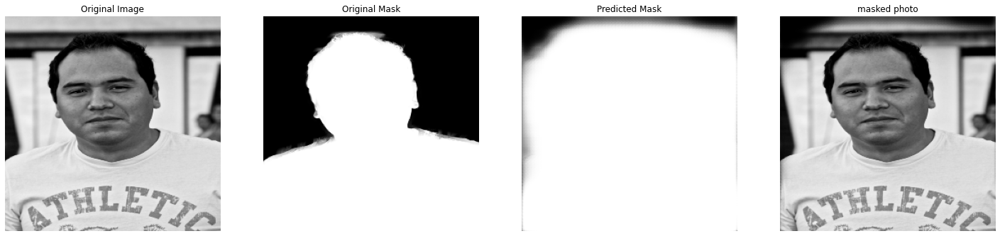

53/53 [==============================] - 88s 1s/step - loss: 0.4251 - accuracy: 0.7477 - MeanIoU: 0.2210 - dice_coeff: 0.7718 - val_loss: 4.0731 - val_accuracy: 0.6379 - val_MeanIoU: 0.6585 - val_dice_coeff: 0.7904
Epoch 2/100
1/1 [==============================] - 0s 26ms/step


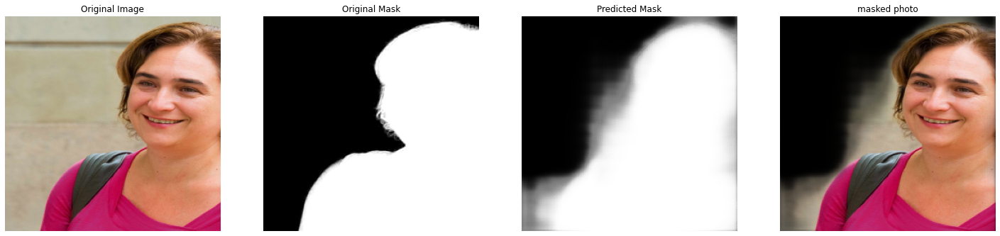

53/53 [==============================] - 54s 1s/step - loss: 0.2489 - accuracy: 0.8403 - MeanIoU: 0.2210 - dice_coeff: 0.8712 - val_loss: 0.5045 - val_accuracy: 0.7974 - val_MeanIoU: 0.2209 - val_dice_coeff: 0.8601
Epoch 3/100
21/53 [==========>...................] - ETA: 31s - loss: 0.2137 - accuracy: 0.8523 - MeanIoU: 0.2249 - dice_coeff: 0.8873

In [ ]:
# Model Training
unet_model_history = model.fit(
    train_ds,
    validation_data = valid_ds,
    epochs = EPOCHS,
    callbacks = CALLBACKS,
    batch_size = BATCH_SIZE,
)

In [ ]:
unet_model_history.history.keys()

In [67]:
model.save('humanSegmentation.h5')

In [7]:
model = keras.models.load_model('humanSegmentationFinal.h5')

In [68]:
history = unet_model_history.history

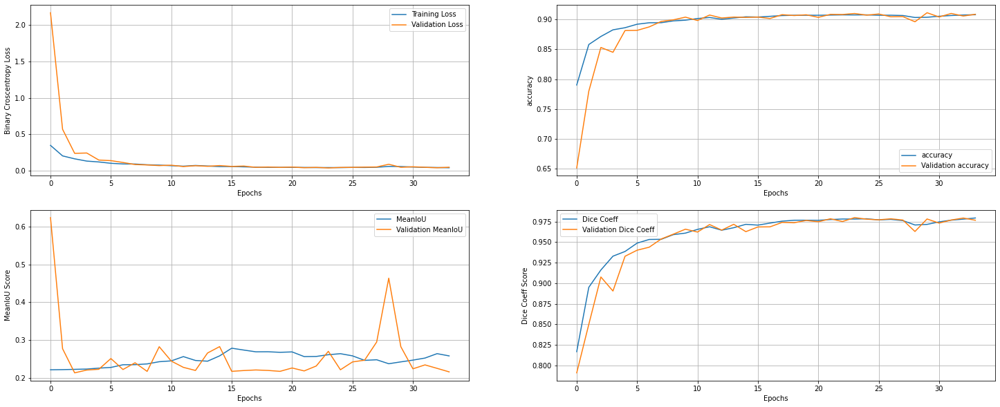

In [69]:
plt.figure(figsize=(25,10))

plt.subplot(2,2,1)
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Binary Croscentropy Loss')
plt.legend()
plt.grid()

plt.subplot(2,2,2)
plt.plot(history['accuracy'], label='accuracy')
plt.plot(history['val_accuracy'], label='Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.grid()

plt.subplot(2,2,3)
plt.plot(history['MeanIoU'], label='MeanIoU')
plt.plot(history['val_MeanIoU'], label='Validation MeanIoU')
plt.xlabel('Epochs')
plt.ylabel('MeanIoU Score')
plt.legend()
plt.grid()

plt.subplot(2,2,4)
plt.plot(history['dice_coeff'], label='Dice Coeff')
plt.plot(history['val_dice_coeff'], label='Validation Dice Coeff')
plt.xlabel('Epochs')
plt.ylabel('Dice Coeff Score')
plt.legend()
plt.grid()
plt.show()

1/1 [==============================] - 0s 25ms/step


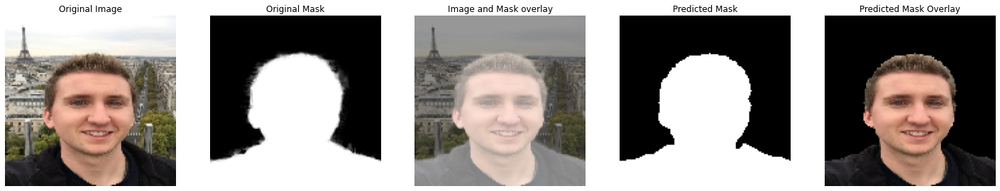

1/1 [==============================] - 0s 23ms/step


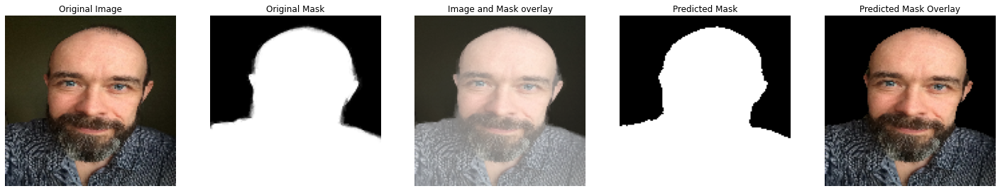

1/1 [==============================] - 0s 22ms/step


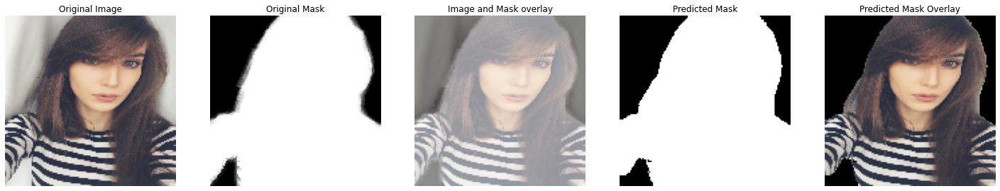

1/1 [==============================] - 0s 22ms/step


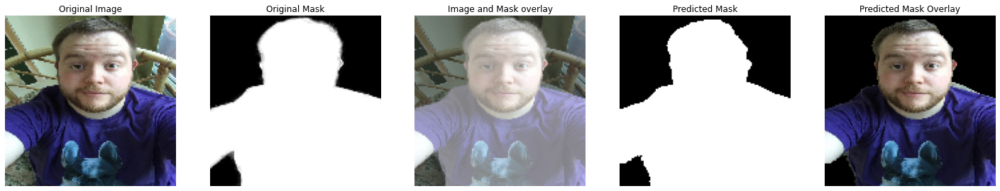

1/1 [==============================] - 0s 50ms/step


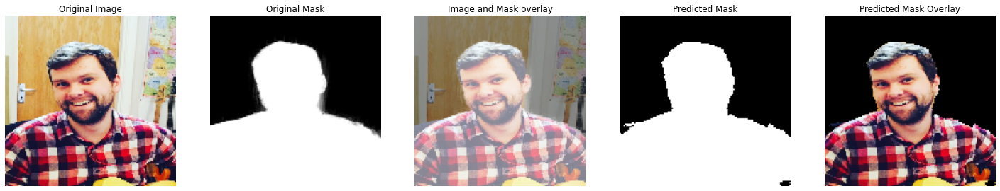

1/1 [==============================] - 0s 44ms/step


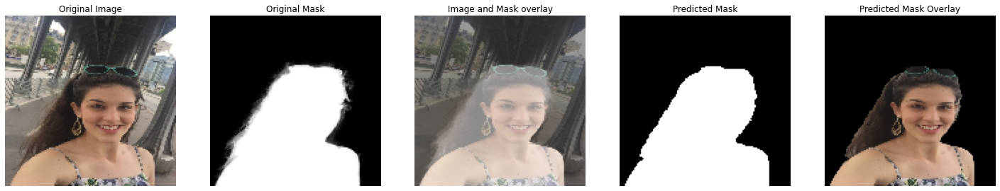

1/1 [==============================] - 0s 41ms/step


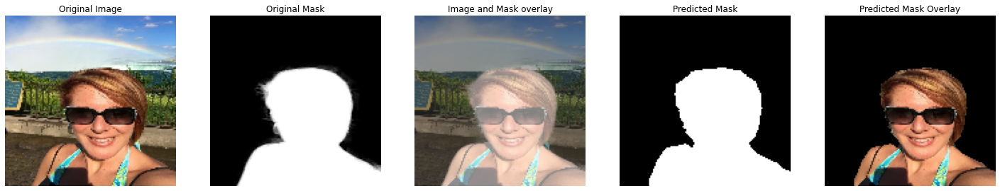

1/1 [==============================] - 0s 35ms/step


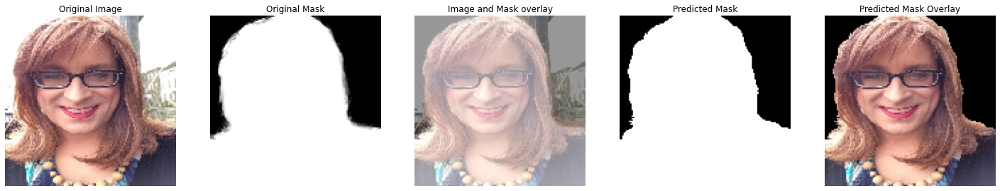

1/1 [==============================] - 0s 44ms/step


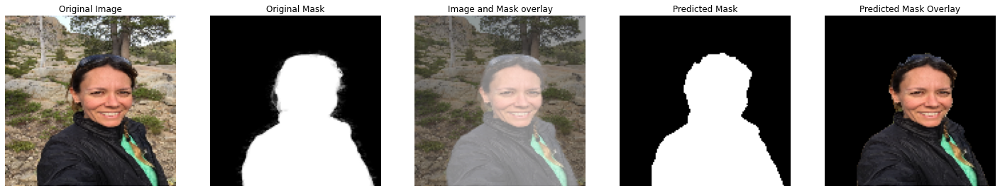

1/1 [==============================] - 0s 25ms/step


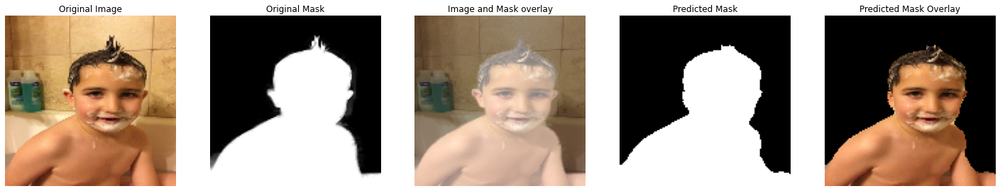

In [70]:
show_images_and_masks(data=training_ds, model=model)

1/1 [==============================] - 0s 25ms/step


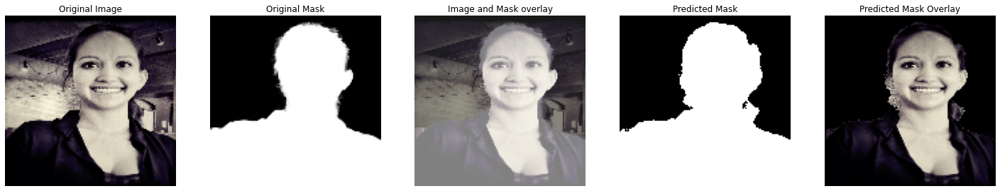

1/1 [==============================] - 0s 40ms/step


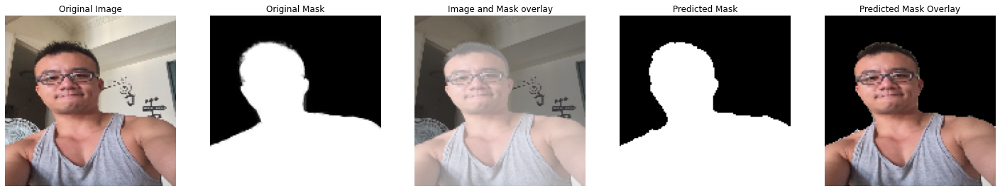

1/1 [==============================] - 0s 26ms/step


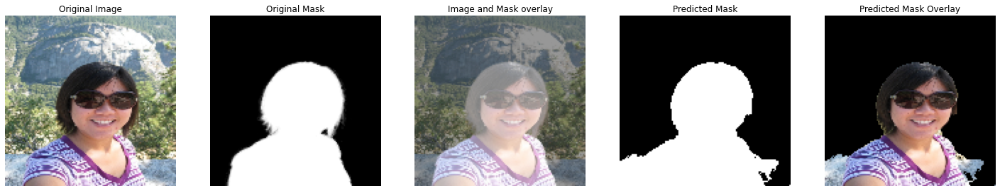

1/1 [==============================] - 0s 28ms/step


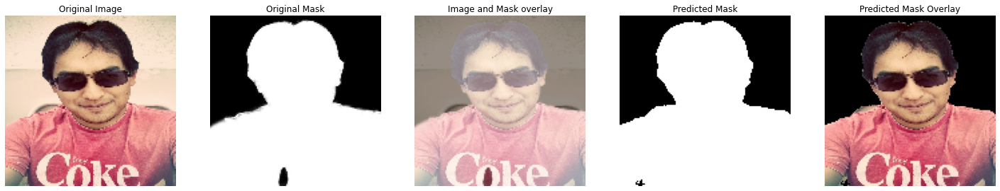

1/1 [==============================] - 0s 25ms/step


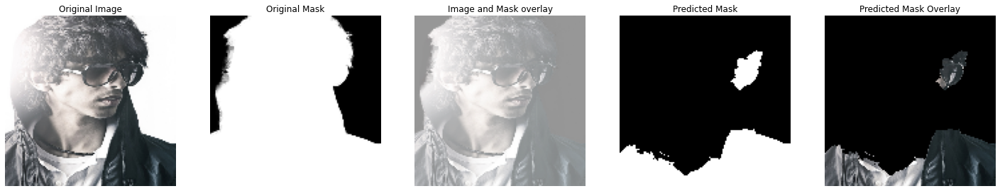

1/1 [==============================] - 0s 24ms/step


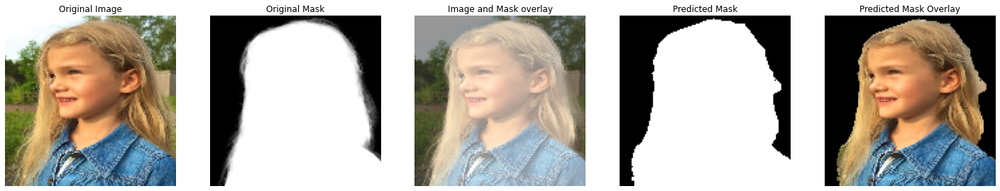

1/1 [==============================] - 0s 25ms/step


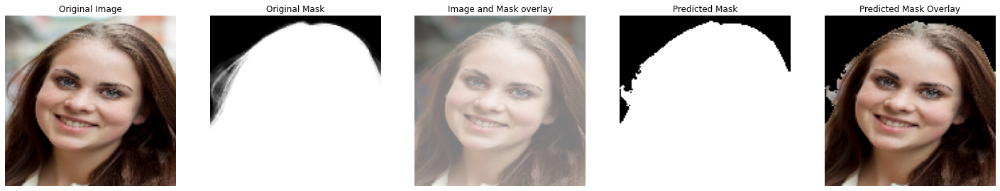

1/1 [==============================] - 0s 25ms/step


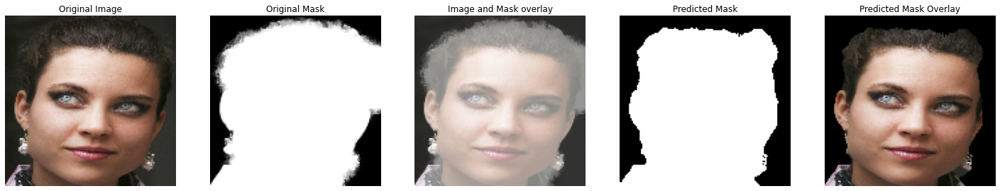

1/1 [==============================] - 0s 24ms/step


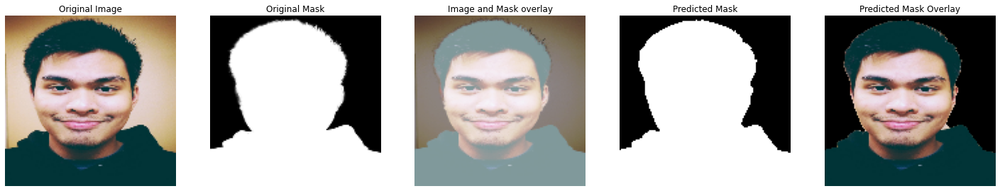

1/1 [==============================] - 0s 36ms/step


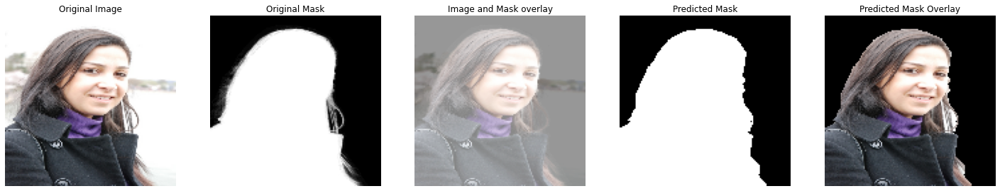

In [71]:
show_images_and_masks(data=test_ds, model=model)

1/1 [==============================] - 0s 27ms/step


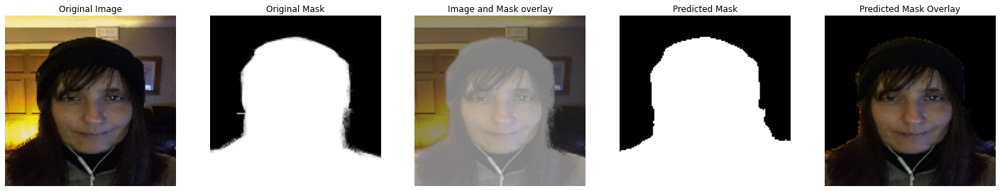

1/1 [==============================] - 0s 25ms/step


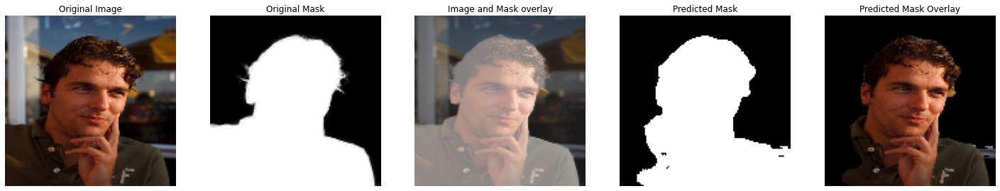

1/1 [==============================] - 0s 23ms/step


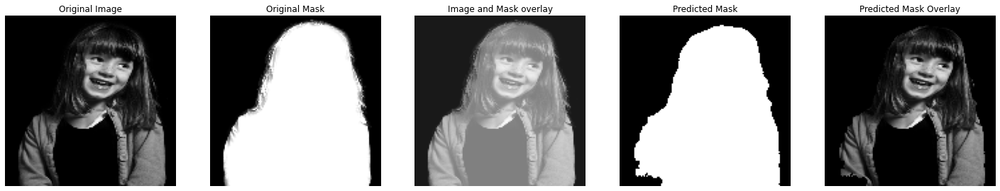

1/1 [==============================] - 0s 24ms/step


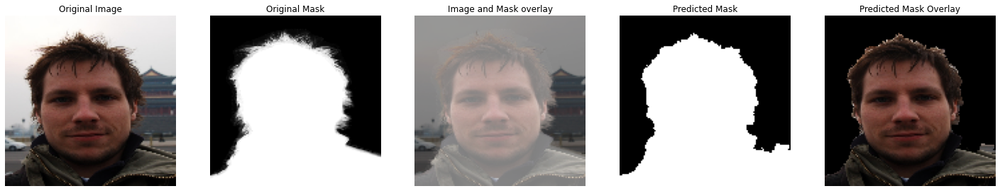

1/1 [==============================] - 0s 30ms/step


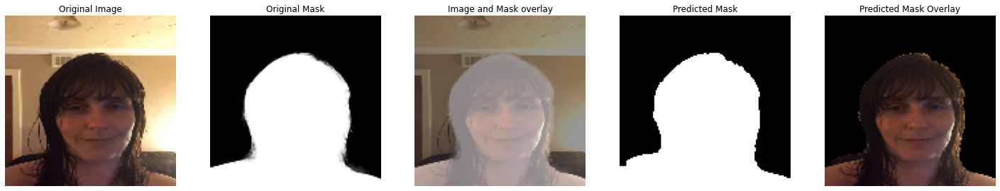

1/1 [==============================] - 0s 39ms/step


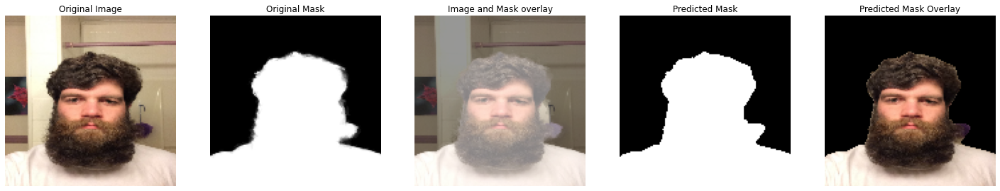

1/1 [==============================] - 0s 32ms/step


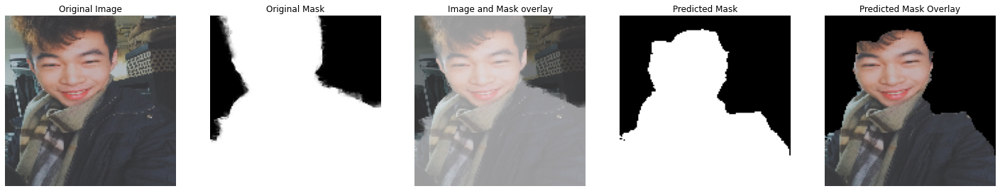

1/1 [==============================] - 0s 37ms/step


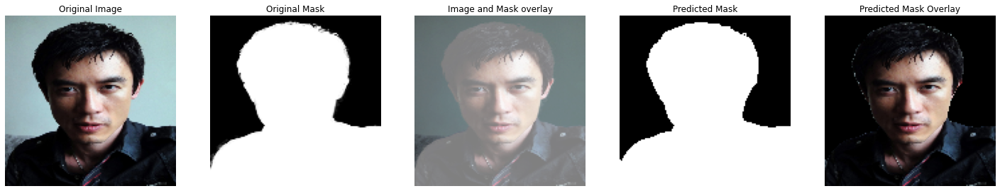

1/1 [==============================] - 0s 32ms/step


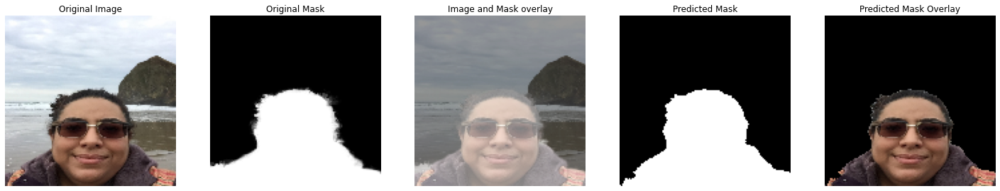

1/1 [==============================] - 0s 39ms/step


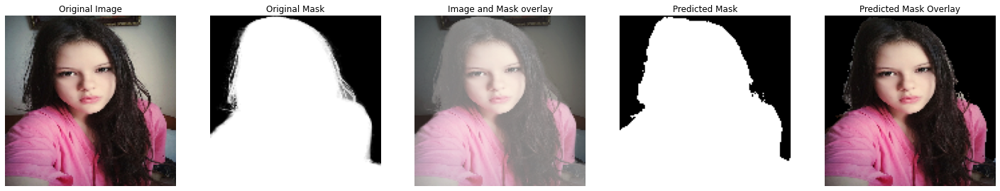

In [72]:
show_images_and_masks(data=test_ds, model=model)

In [23]:
from PIL import Image
from urllib.request import urlopen

def load_img(path):
    img = Image.open(urlopen(path))
    img = img.resize((256, 256)) # resize to the input size of your model
    img = np.asarray(img) / 255.0
    return img
def pre_image(path):
    img = Image.open(urlopen(path))
    img = img.resize((256, 256)) # resize to the input size of your model
    img = np.asarray(img) / 255.0
    img = np.expand_dims(img, axis=0)
    return img

In [44]:
test_image = 'https://thumbs.dreamstime.com/b/selfie-man-blogger-talks-subscribers-sea-beach-waves-hand-smiles-video-young-tourist-background-greets-portrait-159428734.jpg'

In [45]:
real_img = load_img(test_image)
procces_img = pre_image(test_image)

In [46]:
predicted_mask = model.predict(procces_img)[0]


1/1 [==============================] - 0s 130ms/step


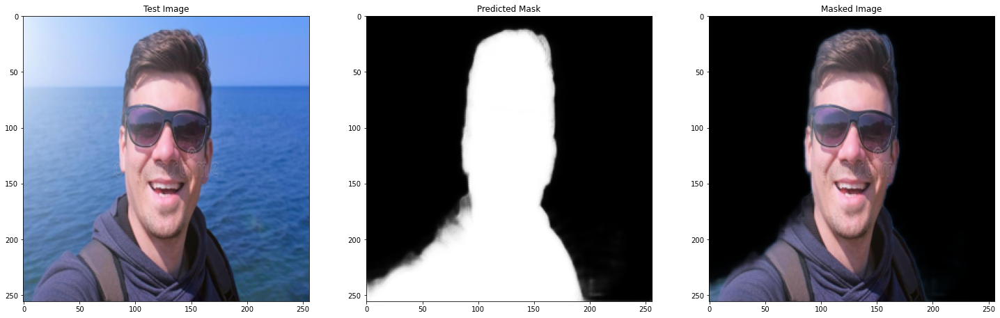

In [47]:

fig, axs = plt.subplots(ncols=3, figsize=(25, 8))
axs[0].imshow(real_img)
axs[0].set_title('Test Image')
axs[1].imshow(predicted_mask, cmap='gray')
axs[1].set_title('Predicted Mask')
axs[2].imshow(predicted_mask * real_img)
axs[2].set_title('Masked Image')
plt.show()